In [1]:
# crawl data from wikipedia using wikipedia-api

import json
import re
import os
import requests

In [211]:
# iterate to get subcategories up to depth 4
def get_subcategories(cate, depth, level=0):
    url="https://en.wikipedia.org/w/api.php?action=query&format=json&list=categorymembers&cmtitle=" +cate + "&cmlimit=max"
    response = requests.get(url)
    data = response.json()

    members=data['query']['categorymembers']

    # if categorymembers is null, return
    if members == []:
        return

    # add categorymembers that are not subcategories to the list
    subcategories = [page['title'] for page in members if page['ns'] == 14]
    artTitles.extend([page['title'] for page in members if (page['ns'] == 0)or (page['ns'] == 2)])
    subcateTitles.extend(subcategories)

    # if level is less than depth, iterate to get subcategories
    if level < depth:
        for subcategory in subcategories:
            get_subcategories(subcategory, depth, level + 1)
    
# Retrieve all subcategories under the category "Space physics" up to subcategory depth of 4
subcateTitles=[]
artTitles=[]
get_subcategories("Category:Space_science", )

# print the list of articles
for title in artTitles:
    print(title)

Space science
Outline of space science
Astrotheology
Atomic Clock Ensemble in Space
Boron aluminum titanium hydride
Community Coordinated Modeling Center
Comparative planetary science
Dust ponds
Extraterrestrial materials
Fukushima's Theorem
Gyrochronology
Heliophysics
List of heliophysics missions
Hunveyor
Husar-rover
Hyperspectral Imager for the Coastal Ocean
Insect Habitat
International Heliophysical Year
NASA Heliophysics
Palimpsest (planetary astronomy)
Planetary geology
Planetary oceanography
Planetary science
Quantum logic clock
Quantum Quest: A Cassini Space Odyssey
Reduced-gravity aircraft
Ring current
Roche limit
Scientific research on the International Space Station
SEDAT
Selenography
Solar physics
Solar System
Space climate
Space food
Space science in Estonia
Space weathering
Spacelab
SPEDAS
Stardust project
Student Spaceflight Experiments Program
Sudden ionospheric disturbance
Theoretical astronomy
UK Space Conference
USA-145
Outer space
Astropolitics
Astrosociology
Bogota

In [4]:
# load the list of articles from pickle
import pickle
with open('artTitles.pkl', 'rb') as f:
    artTitles = pickle.load(f)

In [5]:
# print length of the list
print(len(artTitles))

73584


In [8]:
# crawl the content of the articles 
import requests

# for title in artTitles:
# cut artTitles into 100 pieces
npieces = len(artTitles) // 100
artTitles_pieces = [artTitles[i:i+npieces] for i in range(0, len(artTitles), npieces)]
for i, piece in enumerate(artTitles_pieces,start=44):
    print(i)
    contents= {}
    for title in piece:
        url="https://en.wikipedia.org/w/api.php?action=query&format=json&prop=extracts&exintro=true&explaintext=true&titles=" + title
        response = requests.get(url)
        data = response.json()
        page = data['query']['pages']
        try:
            content = list(page.values())[0]['extract']
            # if content is not empty, add to the dictionary
            if content != "":
                contents[title] = content
        except KeyError:
            continue
    with open('../yz167-yz238/artContent_' + str(i) + '.json', 'w') as f:
        json.dump(contents, f)

44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144


In [18]:
# combine the 100 pieces into one and save it as a json file
import json
import os
contents = {}

for i in range(0, 100):
    with open('../yz167-yz238/artContent_' + str(i) + '.json', 'r') as f:
        content = json.load(f)
        contents.update(content)

with open('../yz167-yz238/artContent.json', 'w') as f:
    json.dump(contents, f)

In [24]:
contents

{'$50SAT': '$50SAT (also known as Eagle-2, OSCAR 76, Morehead-OSCAR 76 and MO-76) is an American amateur radio communications satellite. It was launched on November 21, 2013, with a Dnepr launch vehicle from the Dombarovsky Air Base, in Orenburg, Russia. It was part of the UNISAT-5 satellite program by GAUSS (Group of Astrodynamics for the Use of Space Systems).$50SAT was developed by Bob Twiggs at Morehead State University (MSU) along with three other radio amateurs and was used to train students. The satellite transmits telemetry data in various operating modes in the 70 cm (28 in) band. It is based on the PocketQube design for very small and inexpensive satellites and measures 5 × 5 × 7.5 cm (2.0 × 2.0 × 3.0 in) (1.5 CubeSat). After several months of problems due to low battery voltage, $50SAT finally dropped below the 3.3 volts required for data transmission on July 19, 2015, and thus ceased operation.',
 "'39": '"\'39" is a song by British rock band Queen. Composed by lead guitari

In [30]:
# load artContent.json
import json
with open('../yz167-yz238/artContent.json', 'r') as f:
    artContents = json.load(f)

# preprocessig

(0.0, 5000.0)

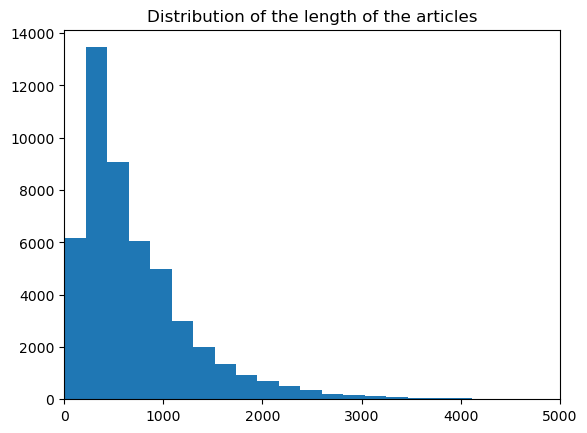

In [43]:
# distributions of the length of the articles

import matplotlib.pyplot as plt
import numpy as np

artNames= list(artContents.keys())
artValues = list(artContents.values())
lengths = [len(art) for art in artValues]
plt.hist(lengths, bins=100)
plt.title('Distribution of the length of the articles')
plt.xlim(0, 5000)

In [48]:
# save atricle names and contents as a json file
with open('artNames.json', 'w') as f:
    json.dump(artNames, f)
with open('artValues.json', 'w') as f:
    json.dump(artValues, f)

In [49]:
# remove artContents with artName not starting with letters
artContents = {k:v for k,v in artContents.items() if k[0].isalpha()}
with open('artContents_letters.json', 'w') as f:
    json.dump(artContents, f)

In [53]:
# save artNae and artValue as a json file
artNames_letters = list(artContents.keys())
artValues_letters = list(artContents.values())
with open('artNames_letters.json', 'w') as f:
    json.dump(artNames_letters, f)
with open('artValues_letters.json', 'w') as f:
    json.dump(artValues_letters, f)

(0.0, 5000.0)

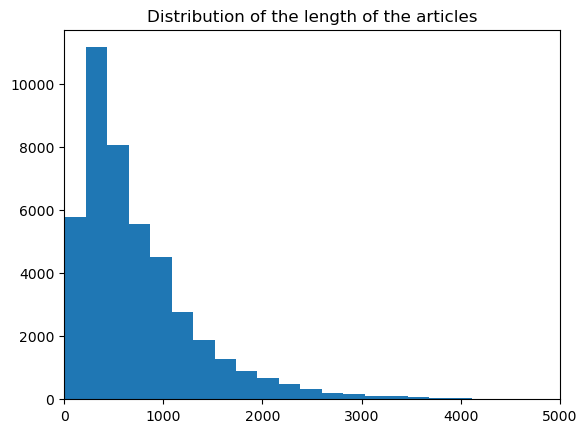

In [51]:
# distributions of the length of the articles

import matplotlib.pyplot as plt
import numpy as np

lengths = [len(art) for art in artContents.values()]
plt.hist(lengths, bins=100)
plt.title('Distribution of the length of the articles')
plt.xlim(0, 5000)